In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import cv2
from scipy import linalg

In [2]:
i1 = cv2.imread('im01.jpg',cv2.IMREAD_COLOR)
i2 = cv2.imread('im02.jpg',cv2.IMREAD_COLOR)
i3 = cv2.imread('im03.jpg',cv2.IMREAD_COLOR)
i4 = cv2.imread('im04.jpg',cv2.IMREAD_COLOR)
i5 = cv2.imread('im05.jpg',cv2.IMREAD_COLOR)

i1 = cv2.cvtColor(i1,cv2.COLOR_BGR2RGB)
i2 = cv2.cvtColor(i2,cv2.COLOR_BGR2RGB)
i3 = cv2.cvtColor(i3,cv2.COLOR_BGR2RGB)
i4 = cv2.cvtColor(i4,cv2.COLOR_BGR2RGB)
i5 = cv2.cvtColor(i5,cv2.COLOR_BGR2RGB)

In [3]:
sift = cv2.xfeatures2d.SIFT_create()
(k1, d1) = sift.detectAndCompute(i1, None)
(k2, d2) = sift.detectAndCompute(i2, None)
(k3, d3) = sift.detectAndCompute(i3, None)
(k4, d4) = sift.detectAndCompute(i4, None)
(k5, d5) = sift.detectAndCompute(i5, None)

fig1 = cv2.drawKeypoints(i1, k1, i1, flags = cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
fig2 = cv2.drawKeypoints(i2, k2, i2, flags = cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
fig3 = cv2.drawKeypoints(i3, k3, i3, flags = cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
fig4 = cv2.drawKeypoints(i4, k4, i4, flags = cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
fig5 = cv2.drawKeypoints(i5, k5, i5, flags = cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

[ WARN:0@1022.371] global shadow_sift.hpp:15 SIFT_create DEPRECATED: cv.xfeatures2d.SIFT_create() is deprecated due SIFT tranfer to the main repository. https://github.com/opencv/opencv/issues/16736


In [4]:
def m(des1,des2):
    a = des1.shape[0]
    b = des2.shape[0]
    t = np.zeros(b)
    f = np.zeros(a)
    for i in range(a):
        for j in range(b):
            temp = sum((des1[i]-des2[j])*(des1[i]-des2[j]))
            t[j] = np.sqrt(temp)
        f[i] = np.argmin(t)
    return f

In [6]:
f12 = m(d1,d2)
f21 = m(d2,d1)
f23 = m(d2,d3)
f32 = m(d3,d2)
f34 = m(d3,d4)
f43 = m(d4,d3)
f45 = m(d4,d5)
f54 = m(d5,d4)

In [7]:
def matching(flag1,flag2):
    result = []
    l1 = len(flag1)
    l2 = len(flag2)
    for i in range(l1):
        for j in range(l2):
            if flag1[i]==j and flag2[j]==i:
                result.append([i,flag1[i]])
                
    return result

In [8]:
temp1 = matching(f12,f21)
temp2 = matching(f23,f32)
temp3 = matching(f34,f43)
temp4 = matching(f45,f54)

In [16]:
print(len(temp2))

508


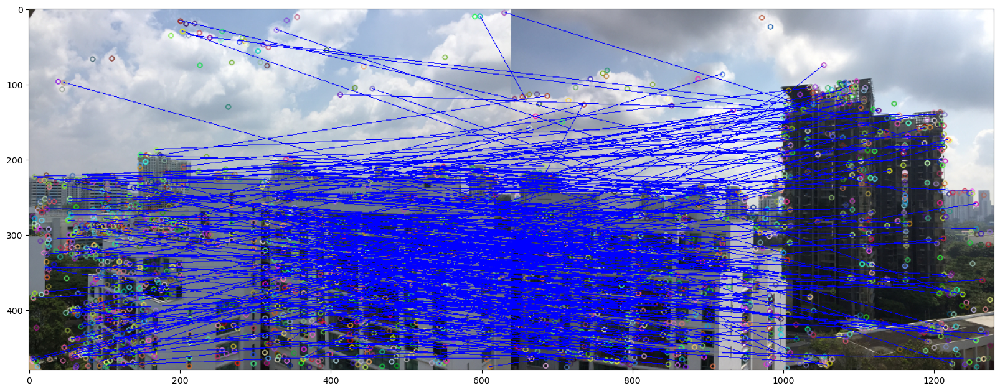

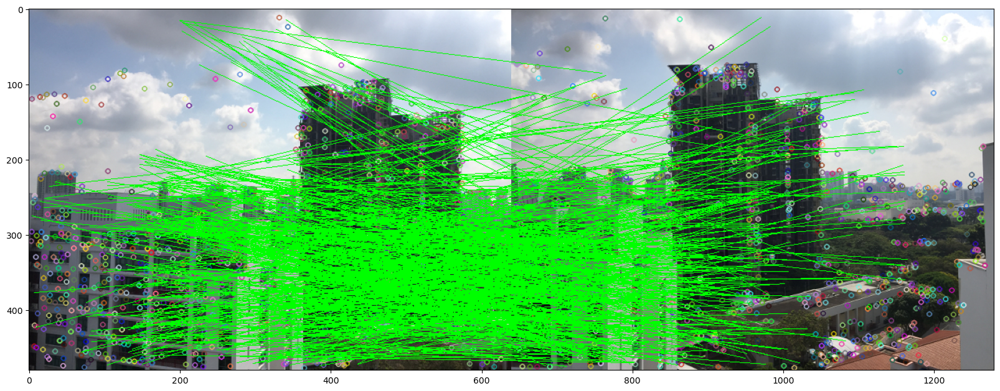

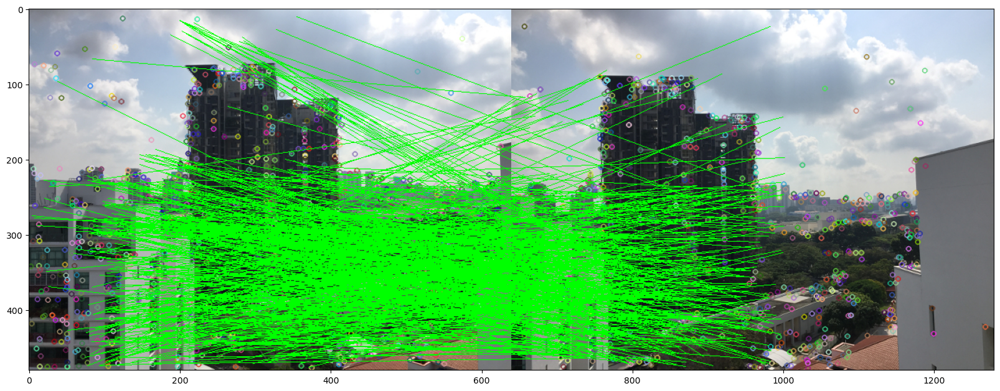

In [18]:
out1 = np.hstack((fig1, fig2)) 
out1 = np.tile(out1, 1)
l1 = len(temp1)
for i in range(l1):
    x1 = k1[int(temp1[i][0])].pt[0]
    y1 = k1[int(temp1[i][0])].pt[1]
    x2 = k2[int(temp1[i][1])].pt[0]
    y2 = k2[int(temp1[i][1])].pt[1]
    cv2.line(out1,(int(x1),int(y1)),(int(x2)+fig1.shape[1],int(y2)),(0,0,255),1)
plt.figure(figsize=(20,10))
plt.imshow(out1)
plt.show()

out2 = np.hstack((fig2, fig3)) 
out2 = np.tile(out2, 1)
l2 = len(temp2)
for i in range(l2):
    x1 = k1[int(temp2[i][0])].pt[0]
    y1 = k1[int(temp2[i][0])].pt[1]
    x2 = k2[int(temp2[i][1])].pt[0]
    y2 = k2[int(temp2[i][1])].pt[1]
    cv2.line(out2,(int(x1),int(y1)),(int(x2)+fig2.shape[1],int(y2)),(0,255,0),1)
plt.figure(figsize=(20,10))
plt.imshow(out2)
plt.show()

out3 = np.hstack((fig3, fig4)) 
out3 = np.tile(out3, 1)
l3 = len(temp3)
for i in range(l3):
    x1 = k1[int(temp3[i][0])].pt[0]
    y1 = k1[int(temp3[i][0])].pt[1]
    x2 = k2[int(temp3[i][1])].pt[0]
    y2 = k2[int(temp3[i][1])].pt[1]
    cv2.line(out3,(int(x1),int(y1)),(int(x2)+fig4.shape[1],int(y2)),(0,255,0),1)
plt.figure(figsize=(20,10))
plt.imshow(out3)
plt.show()

In [19]:
def matrixH(A, B):
    temp = np.zeros([8,9])
    for i in range(4):
        x1 = A[i][0]
        y1 = A[i][1]
        x2 = B[i][0]
        y2 = B[i][1]
        temp[2*i][:] = [x1,y1,1,0,0,0,-x2*x1,-x2*y1,-x2]
        temp[2*i+1][:] = [0,0,0,x1,y1,1,-y2*x1,-y2*y1,-y2]
        
        
    u,d,vt = linalg.svd(temp)
    v = vt[-1,:]
    v = v / v[-1]
    v = np.reshape(v, newshape=(3, 3))
    
    return v/v[2,2]

In [22]:
def randpoint(kp1,kp2,matching):
    a,b,c,d = np.random.randint(0,len(matching),4)
    rand = [a,b,c,d]
    points1 = np.zeros([4,2])
    points2 = np.zeros([4,2])
    for i in range(4):
        points1[i][0] = kp1[int(matching[rand[i]][0])].pt[0]
        points1[i][1] = kp1[int(matching[rand[i]][0])].pt[1]
        points2[i][0] = kp2[int(matching[rand[i]][1])].pt[0]
        points2[i][1] = kp2[int(matching[rand[i]][1])].pt[1]
        
    return points1,points2

In [31]:
one = np.hstack((fig1, fig2))
e = 1.5
k = 0
iter = 10000
mat1 = []

while k < iter:
    points1,points2 = randpoint(k1,k2,temp1)
    H = matrixH(points1,points2)
    
    tt = []        
    for i in range(len(temp1)):
        x1 = k1[int(temp1[i][0])].pt[0]
        y1 = k1[int(temp1[i][0])].pt[1]
        x2 = k2[int(temp1[i][1])].pt[0]
        y2 = k2[int(temp1[i][1])].pt[1]
        dim = (H[2][0]*x1 + H[2][1]*y1 + H[2][2])
        hx1 = (H[0][0]*x1 + H[0][1]*y1 + H[0][2]) / dim
        hy1 = (H[1][0]*x1 + H[1][1]*y1 + H[1][2]) / dim
        distance = (x2 - hx1)**2 + (y2 - hy1)**2
        distance = np.sqrt(distance)
        if distance < e:
            tt.append(temp1[i])
            
    if len(tt) > len(mat1):
        mat1 = tt 
    
    k =k+1

two = np.hstack((fig2, fig3))
e = 1.5
k = 0
iter = 10000
mat2 = []

while k < iter:
    points1,points2 = randpoint(k2,k3,temp2)
    H = matrixH(points1,points2)
    
    tt = []        
    for i in range(len(temp2)):
        x1 = k2[int(temp2[i][0])].pt[0]
        y1 = k2[int(temp2[i][0])].pt[1]
        x2 = k3[int(temp2[i][1])].pt[0]
        y2 = k3[int(temp2[i][1])].pt[1]
        dim = (H[2][0]*x1 + H[2][1]*y1 + H[2][2])
        hx1 = (H[0][0]*x1 + H[0][1]*y1 + H[0][2]) / dim
        hy1 = (H[1][0]*x1 + H[1][1]*y1 + H[1][2]) / dim
        distance = (x2 - hx1)**2 + (y2 - hy1)**2
        distance = np.sqrt(distance)
        if distance < e:
            tt.append(temp2[i])
            
    if len(tt) > len(mat2):
        mat2 = tt 
    
    k =k+1
    
    
three = np.hstack((fig3, fig4))
e = 1.5
k = 0
iter = 10000
mat3 = []

while k < iter:
    points1,points2 = randpoint(k3,k4,temp3)
    H = matrixH(points1,points2)
    
    tt = []        
    for i in range(len(temp3)):
        x1 = k3[int(temp3[i][0])].pt[0]
        y1 = k3[int(temp3[i][0])].pt[1]
        x2 = k4[int(temp3[i][1])].pt[0]
        y2 = k4[int(temp3[i][1])].pt[1]
        dim = (H[2][0]*x1 + H[2][1]*y1 + H[2][2])
        hx1 = (H[0][0]*x1 + H[0][1]*y1 + H[0][2]) / dim
        hy1 = (H[1][0]*x1 + H[1][1]*y1 + H[1][2]) / dim
        distance = (x2 - hx1)**2 + (y2 - hy1)**2
        distance = np.sqrt(distance)
        if distance < e:
            tt.append(temp3[i])
            
    if len(tt) > len(mat3):
        mat3 = tt 
    
    k =k+1

In [25]:
def draw(mat,kp1,kp2,img,fig):
    src = []
    des = []
    length = len(mat)
    for i in range(length):
        x1 = kp1[int(mat[i][0])].pt[0]
        y1 = kp1[int(mat[i][0])].pt[1]
        p1 = kp2[int(mat[i][1])].pt[0]
        p2 = kp2[int(mat[i][1])].pt[1]
        src.append([x1, y1])
        des.append([p1, p2])
        cv2.line(img,(int(x1),int(y1)),(int(p1) + fig.shape[1],int(p2)),(0,255,0),1)
    plt.figure(figsize=(20,10))
    plt.imshow(img)
    plt.show()
    
    return src,des

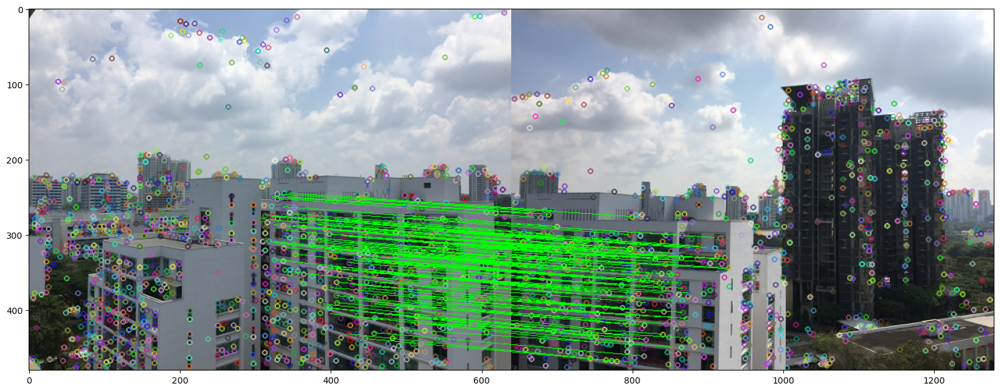

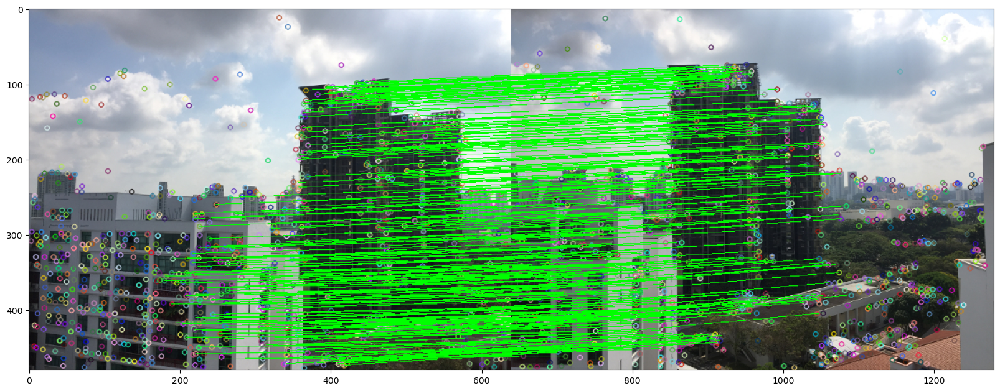

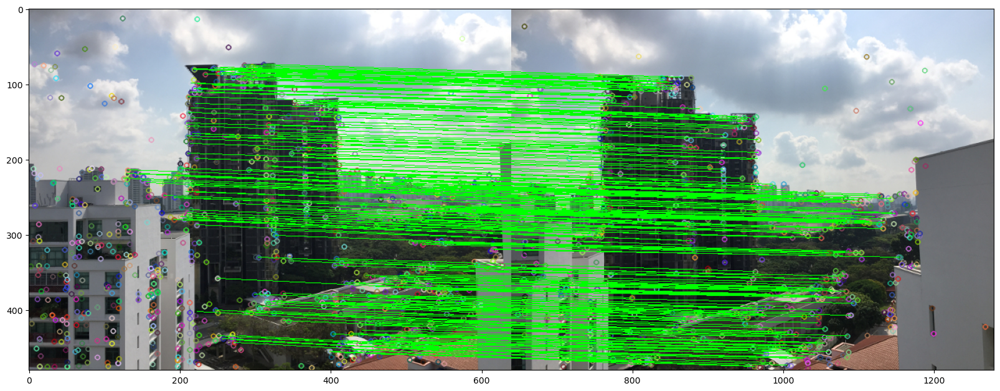

In [32]:
src1,des1 = draw(mat1,k1,k2,one,fig1)
src2,des2 = draw(mat2,k2,k3,two,fig2)
src3,des3 = draw(mat3,k3,k4,three,fig3)

In [33]:
print(len(src1))
print(len(des1))
print(len(src2))
print(len(des2))
print(len(src3))
print(len(des3))

126
126
330
330
305
305


In [34]:
def matrixH2(A, B, l):
    temp = np.zeros([l*2,9])
    for i in range(l):
        x1 = A[i][0]
        y1 = A[i][1]
        x2 = B[i][0]
        y2 = B[i][1]
        temp[2*i][:] = [x1,y1,1,0,0,0,-x2*x1,-x2*y1,-x2]
        temp[2*i+1][:] = [0,0,0,x1,y1,1,-y2*x1,-y2*y1,-y2]
        
        
    u,d,vt = linalg.svd(temp)
    v = vt[8].reshape((3,3))
    
    return v/v[2,2]

In [37]:
a1 = np.array(src1)
a2 = np.array(des1)
b1 = np.array(src2)
b2 = np.array(des2)
c1 = np.array(src3)
c2 = np.array(des3)

l1 = len(src1)
l2 = len(src2)
l3 = len(src3)

H11 = matrixH2(a1,a2,l1)
print(H11)
H22 = matrixH2(b1,b2,l2)
print(H22)
H33 = matrixH2(c1,c2,l3)
print(H33)

[[ 2.16899775e+00 -1.04174112e-01 -6.38053081e+02]
 [ 5.20105023e-01  1.75913328e+00 -1.86280665e+02]
 [ 1.82768131e-03 -1.85788224e-04  1.00000000e+00]]
[[ 1.45973344e+00  4.64738377e-02 -2.64930683e+02]
 [ 1.41848381e-01  1.33248868e+00 -9.46010713e+01]
 [ 6.87197764e-04  1.16662938e-04  1.00000000e+00]]
[[ 1.22995289e+00 -1.77739325e-02 -1.30754223e+02]
 [ 8.99076989e-02  1.09515799e+00 -6.05373642e+00]
 [ 3.98214816e-04 -1.01212743e-04  1.00000000e+00]]


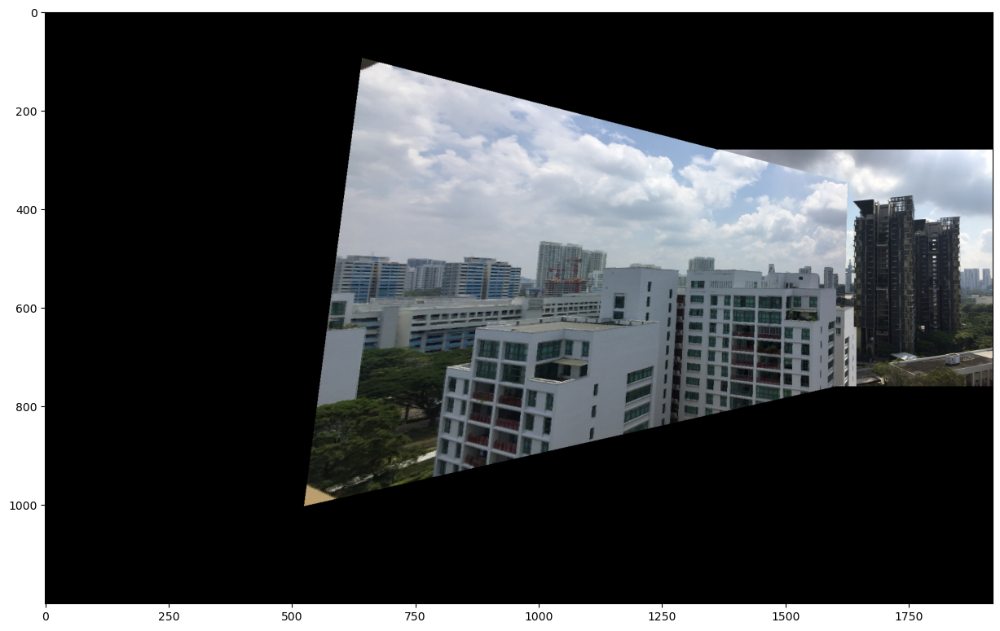

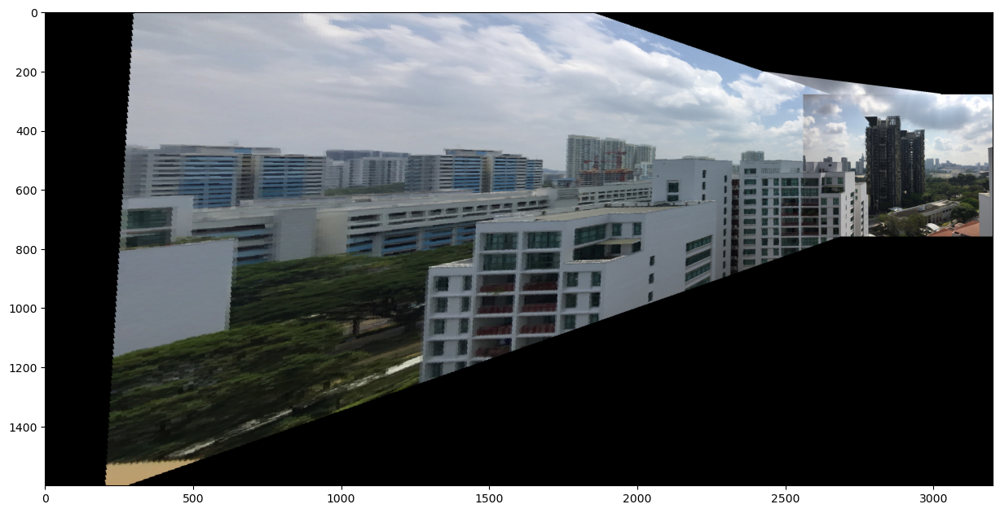

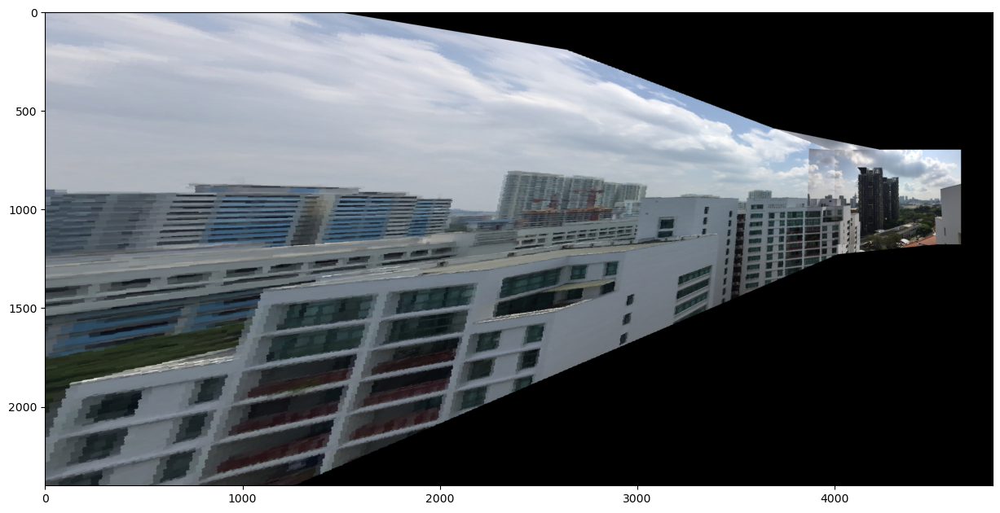

In [55]:
i1 = cv2.imread('im01.jpg',cv2.IMREAD_COLOR)
i2 = cv2.imread('im02.jpg',cv2.IMREAD_COLOR)
i3 = cv2.imread('im03.jpg',cv2.IMREAD_COLOR)
i4 = cv2.imread('im04.jpg',cv2.IMREAD_COLOR)
i5 = cv2.imread('im05.jpg',cv2.IMREAD_COLOR)

i1 = cv2.cvtColor(i1,cv2.COLOR_BGR2RGB)
i2 = cv2.cvtColor(i2,cv2.COLOR_BGR2RGB)
i3 = cv2.cvtColor(i3,cv2.COLOR_BGR2RGB)
i4 = cv2.cvtColor(i4,cv2.COLOR_BGR2RGB)
i5 = cv2.cvtColor(i5,cv2.COLOR_BGR2RGB)
new = np.zeros([1200,1920,3])
H1 = i1.shape[0]
W1 = i1.shape[1]
H2 = i2.shape[0]
W2 = i2.shape[1]

for i in range(280,280+H2):
    for j in range(1280,1280+W2):
        new[i][j] = i2[i-280][j-1280]
        
i = 0
while i<H1:
    j = 0
    while j<W1:
        dim = H11[2][0]*j + H11[2][1]*i + H11[2][2]
        tempx = (H11[0][0]*j + H11[0][1]*i + H11[0][2])/dim
        tempy = (H11[1][0]*j + H11[1][1]*i + H11[1][2])/dim
        new[int(tempy)+280][int(tempx)+1280] = i1[int(i)][int(j)]
        j = j+0.1
    i = i+0.1

plt.figure(figsize=(15,15))
plt.imshow(new.astype('uint8'))
plt.show()



new2 = np.zeros([1600,3200,3])
H1 = new.shape[0]
W1 = new.shape[1]
H2 = i3.shape[0]
W2 = i3.shape[1]
i=0
while i < H1:
    j=0
    while j < W1:
        x = j - 1280
        y = i - 280
        dim = (H22[2][0]*x + H22[2][1]*y + H22[2][2])
        tempx = (H22[0][0]*x + H22[0][1]*y + H22[0][2]) / dim
        tempy = (H22[1][0]*x + H22[1][1]*y + H22[1][2]) / dim
        if 0<int(tempy)+280 < 1600 and 0<int(tempx)+2560 < 3200:
            new2[int(tempy)+280][int(tempx)+2560] = new[int(i)][int(j)]
        j += 0.1
    i += 0.1
for i in range(280,280+H2):
    for j in range(2560,2560+W2):
        new2[i][j] = i3[i-280][j-2560]


plt.figure(figsize=(15,15))
plt.imshow(new2.astype('uint8'))
plt.show()


new3 = np.zeros([2400,4800,3])
H1 = new2.shape[0]
W1 = new2.shape[1]
H2 = i4.shape[0]
W2 = i4.shape[1]
i=0
while i < H1:
    j=0
    while j < W1:
        x = j - 2560
        y = i - 280
        dim = (H33[2][0]*x + H33[2][1]*y + H33[2][2])
        tempx = (H33[0][0]*x + H33[0][1]*y + H33[0][2]) / dim
        tempy = (H33[1][0]*x + H33[1][1]*y + H33[1][2]) / dim
        if 0<int(tempy)+700 < 2400 and 0<int(tempx)+4000 < 4800:
            new3[int(tempy)+700][int(tempx)+4000] = new2[int(i)][int(j)]
        j += 0.1
    i += 0.1
for i in range(700,700+H2):
    for j in range(4000,4000+W2):
        new3[i][j] = i4[i-700][j-4000]


plt.figure(figsize=(15,15))
plt.imshow(new3.astype('uint8'))
plt.show()